<a href="https://colab.research.google.com/github/zuvelatamara/PPPO-2025/blob/main/PPPO_V3_OpenCV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **OpenCV**
**OpenCV** (Open Source Computer Vision Library) je otvorena biblioteka za rad sa slikama i video zapisima, koja omogućava implementaciju različitih tehnika iz oblasti **računarskog vida** (Computer Vision) i **obrade slike** (Image Processing).

Prvobitno je razvijena od strane kompanije Intel početkom 2000-ih, a danas predstavlja jedan od najrasprostranjenijih alata za prepoznavanje objekata, detekciju lica, analizu pokreta, segmentaciju, filtriranje i mnoge druge zadatke vezane za digitalne slike.

OpenCV se najčešće koristi zajedno sa Python-om, ali podržava i druge jezike poput C++, Java i MATLAB-a.

Kroz ovu vežbu naučićemo kako da:

- učitamo i prikažemo slike pomoću OpenCV biblioteke,
- primenimo osnovne geometrijske i kolor transformacije,
- koristimo filtere i operacije detekcije ivica,
- analiziramo i pronađemo konture i oblike,
- razumemo osnovne principe morfoloških transformacija.

Cilj je da steknemo osnovno razumevanje načina na koji računar “vidi” i obrađuje sliku, kao i da naučiš kako OpenCV može poslužiti kao osnova za naprednije zadatke prepoznavanja oblika i veštačke inteligencije.


# 0. Setup i biblioteke

In [ ]:
# Uvoz osnovnih biblioteka za rad sa slikama
import numpy as np               # Numpy — rad sa nizovima i matričnim operacijama
import matplotlib.pyplot as plt  # Matplotlib — prikazivanje slika i grafikona u Colab okruženju
import cv2                       # OpenCV — glavna biblioteka za obradu i analizu slika


# 1. Sharpening
Izoštrenje slike (Sharpening) je tehnika kojom se povećava kontrast između susednih piksela kako bi se naglasile ivice, oblici i detalji na slici.
Najčešće se koristi kao pripremni korak u zadacima detekcije ivica, segmentacije ili prepoznavanja objekata.

Ova tehnika se ostvaruje primenom konvolucionih filtera (kernela) — malih matrica koje se pomeraju preko slike i menjaju vrednosti piksela na osnovu njihovih suseda.

Kod izoštrenja, centralni piksel se pojačava, dok se susedni pikseli umanjuju, čime se pojačava prelaz između svetlih i tamnih oblasti.

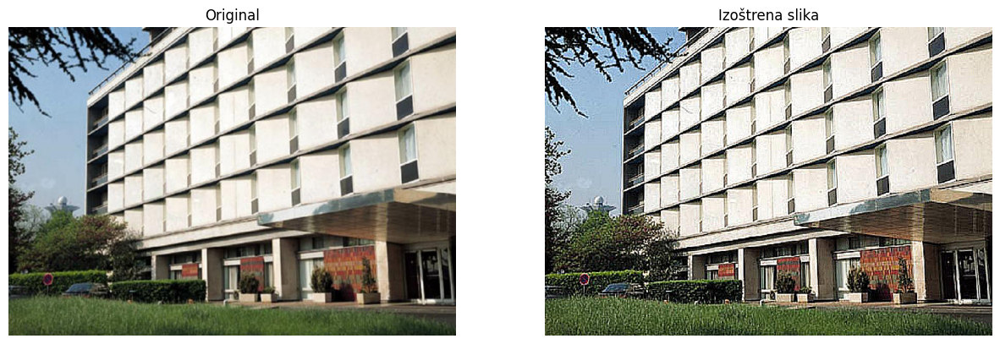

In [ ]:
# Učitavanje i prikaz originalne slike

# Učitavamo sliku i konvertujemo boje iz BGR u RGB format
# OpenCV po defaultu koristi BGR redosled kanala, dok Matplotlib koristi RGB
image = cv2.imread('images/data/building.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Prikaz originalne slike pomoću Matplotlib biblioteke
plt.figure(figsize=(15, 15))
plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')  # Uklanja ose radi lepšeg prikaza


# Definisanje kernela za izoštrenje

# Kernel (filter) je mala matrica koja se koristi za konvoluciju sa slikom.
# Ova konkretna matrica pojačava centralni piksel (vrednost 9) i smanjuje vrednosti susednih piksela (-1),
# čime se naglašavaju ivice i prelazi u slici.
kernel_sharpening = np.array([[-1, -1, -1],
                              [-1,  9, -1],
                              [-1, -1, -1]])

# Napomena: ne vršimo normalizaciju, jer zbir svih elemenata kernela iznosi 1.


# Primena filtera (konvolucije) na sliku
# Funkcija filter2D prolazi kroz svaki piksel slike i primenjuje kernel kako bi izračunala novu vrednost piksela.
# Drugi argument (-1) znači da izlazna slika ima istu dubinu (broj kanala) kao i ulazna.
sharpened = cv2.filter2D(image, -1, kernel_sharpening)


# Prikaz rezultata
plt.subplot(1, 2, 2)
plt.title("Izoštrena slika")
plt.imshow(sharpened); plt.axis('off')
plt.show()

# 2. Thresholding, Binarizacija & Adaptivni Thresholding

**Šta je Thresholding?**

Thresholding (pragovanje) je jedna od osnovnih tehnika u obradi slike koja sivu sliku pretvara u binarni oblik – crno-belo.

Ideja je jednostavna: ako je neki piksel dovoljno svetao (iznad određenog praga T), postaje beli (255), a ako je taman (ispod praga), postaje crni (0).

Na taj način se smanjuje količina informacija i ističu oblici i konture koji su bitni za dalje korake – poput detekcije ivica, kontura ili OCR prepoznavanja teksta.


**Vrste thresholdinga**
  1. ***Globalni thresholding***

Koristi jedan prag (T) za celu sliku.
Sve vrednosti ispod T se postavljaju na 0, a sve iznad na 255.

- **Prednost**: Jednostavan i brz.
-  **Mane**: Osetljiv na promene osvetljenja — ako je deo slike tamniji, može izgubiti detalje.


2. ***Otsu-ovo thresholding***

Otsu-ova metoda automatski izračunava optimalan prag T analizom histograma slike. Ona traži vrednost praga koja maksimalno razdvaja tamne i svetle piksele (tzv. bimodalni histogram).

- **Prednost**: Nije potrebno ručno birati prag.
- **Mane**: Ne radi idealno ako slika nema jasan kontrast između objekta i pozadine.
- Najbolje radi na slikama s dvema jasno odvojenim klasama piksela (npr. crna slova na belom papiru).


3. ***Adaptivni thresholding***

Kod adaptivnog pristupa prag nije isti za celu sliku, već se izračunava lokalno za svaku oblast slike (blok).
To znači da se prag menja u zavisnosti od lokalnog osvetljenja.

Postoje dve varijante:

a) cv2.ADAPTIVE_THRESH_MEAN_C: prag = srednja vrednost okolnih piksela − C

b) cv2.ADAPTIVE_THRESH_GAUSSIAN_C: prag = Gauss-ponderisana sredina − C

- **Prednost**: Odličan za slike sa neujednačenim osvetljenjem (npr. skenirane stranice sa senkama).
- **Mane**: Potrebno pažljivo podešavanje parametara (block size, C).
- Idealno za: digitalizaciju starih dokumenata, analizu rukopisa, biomedicinske slike.

**Ključne razlike**

| Osobina        | Globalni                 | Otsu                                        | Adaptivni                         |
| -------------- | ------------------------ | ------------------------------------------- | --------------------------------- |
| Prag           | Fiksan, ručno zadat      | Automatski određen                          | Računa se lokalno                 |
| Pogodan za     | Jednako osvetljene slike | Dvostruko osvetljenje (bimodalni histogram) | Neujednačeno osvetljenje          |
| Brzina         | Najbrži                  | Sporiji (računa histogram)                  | Najsporiji (računa po blokovima)  |
| Parametri      | `T`                      | Nema (određuje sam)                         | `blockSize`, `C`                  |
| Tipični primer | Crno-bela slika logotipa | Crni tekst na beloj pozadini                | Stara skenirana knjiga sa senkama |


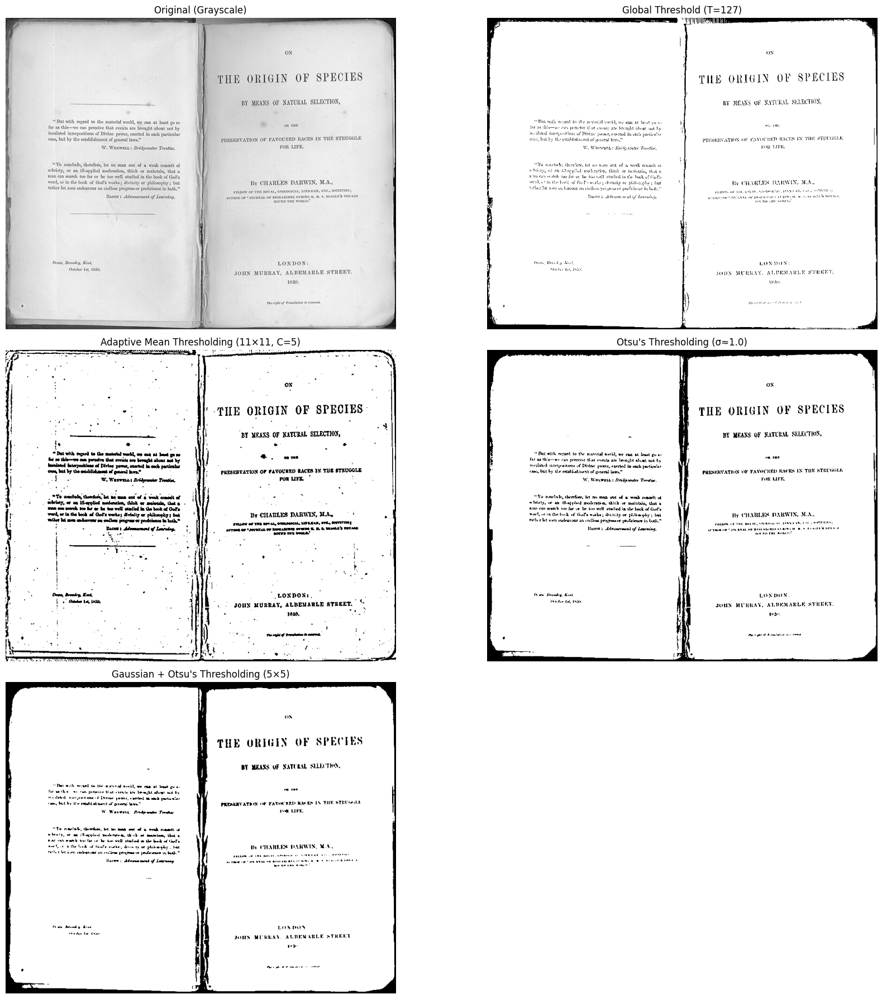

In [ ]:
# Thresholding na skeniranom tekstu
# Cilj: od sive slike (scan) dobiti binarnu (crno-belu) verziju pogodnu za čitanje/analizu.

# Učitavanje kao grayscale (cv2.imread sa flagom 0 daje sivu sliku).
image = cv2.imread('images/data/Origin_of_Species.jpg', 0)

plt.figure(figsize=(18, 18))
plt.subplot(3, 2, 1)
plt.title("Original (Grayscale)")
plt.imshow(image, cmap='gray')  # važno: prikaz u grayscale kolormap-u
plt.axis('off')

# Globalno pragovanje
# Sve vrednosti ispod 127 postaju 0 (crno), a iznad/ jednako 127 postaju 255 (belo).
# Jednostavno, ali osetljivo na neujednačeno osvetljenje.
ret, thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

plt.subplot(3, 2, 2)
plt.title("Global Threshold (T=127)")
plt.imshow(thresh1, cmap='gray')
plt.axis('off')

# Pre-filter: Gaussian blur
# U praksi je dobro blago zamućivanje da se ukloni šum
# (olakšava i adaptivno i Otsu pragovanje).
image_blur3 = cv2.GaussianBlur(image, (3, 3), 0)

# Adaptivno pragovanje (MEAN)
# Prag se računa lokalno po bloku; poslednji parametar (C) "skida" malo od lokalne sredine.
# Napomena: blok veličina mora biti neparna i > 1. Tipične vrednosti: 11, 15, 21...
thresh_adapt_mean = cv2.adaptiveThreshold(
    image_blur3, 255,
    cv2.ADAPTIVE_THRESH_MEAN_C,  # lokalni prag = srednja vrednost u bloku
    cv2.THRESH_BINARY,
    11,  # blok (prozor) 11x11 je robusniji od 3x3 na realnim skenovima
    5    # C: konstanta koja se oduzima od lokalne sredine
)

plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding (11×11, C=5)")
plt.imshow(thresh_adapt_mean, cmap='gray')
plt.axis('off')

# 5) Otsu-ovo pragovanje (bez i sa Gaussian blur-om)
# Otsu sam bira optimalan prag (drugi argument T se ignoriše kada je T=0 i THRESH_OTSU je uključen).
# Varijanta bez dodatnog zamućivanja (koristi prethodno image_blur3 kao blago filtriran input).
_, th_otsu = cv2.threshold(image_blur3, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding (σ≈1.0)")
plt.imshow(th_otsu, cmap='gray')
plt.axis('off')

# Otsu posle jačeg Gaussian blura — često stabilniji prag na „flekatim“ skenovima
blur5 = cv2.GaussianBlur(image, (5, 5), 0)
_, th_otsu_blur5 = cv2.threshold(blur5, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.subplot(3, 2, 5)
plt.title("Gaussian + Otsu's Thresholding (5×5)")
plt.imshow(th_otsu_blur5, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


# 3. Morfološke operacije: Dilatacija, Erozija, Otvaranje i Zatvaranje

| Operacija                        | Opis                                | Efekat                                       |
| -------------------------------- | ----------------------------------- | -------------------------------------------- |
| **Erosion** (erozija)            | Uklanja piksele na ivicama objekata | Sužava svetle oblasti, uklanja šum           |
| **Dilation** (dilatacija)        | Dodaje piksele uz ivice objekata    | Proširuje svetle oblasti, popunjava praznine |
| **Opening** = Erosion → Dilation | Prvo uklanja šum, zatim vraća oblik | Uklanja male fleke (šum)                     |
| **Closing** = Dilation → Erosion | Prvo proširuje, pa sužava           | Popunjava male rupe i praznine               |

Kernel (ili „element strukture“) najčešće je mala matrica veličine 3×3, 5×5 ili 7×7 koja definiše kako se okolni pikseli posmatraju.
Veći kernel = jači efekat.

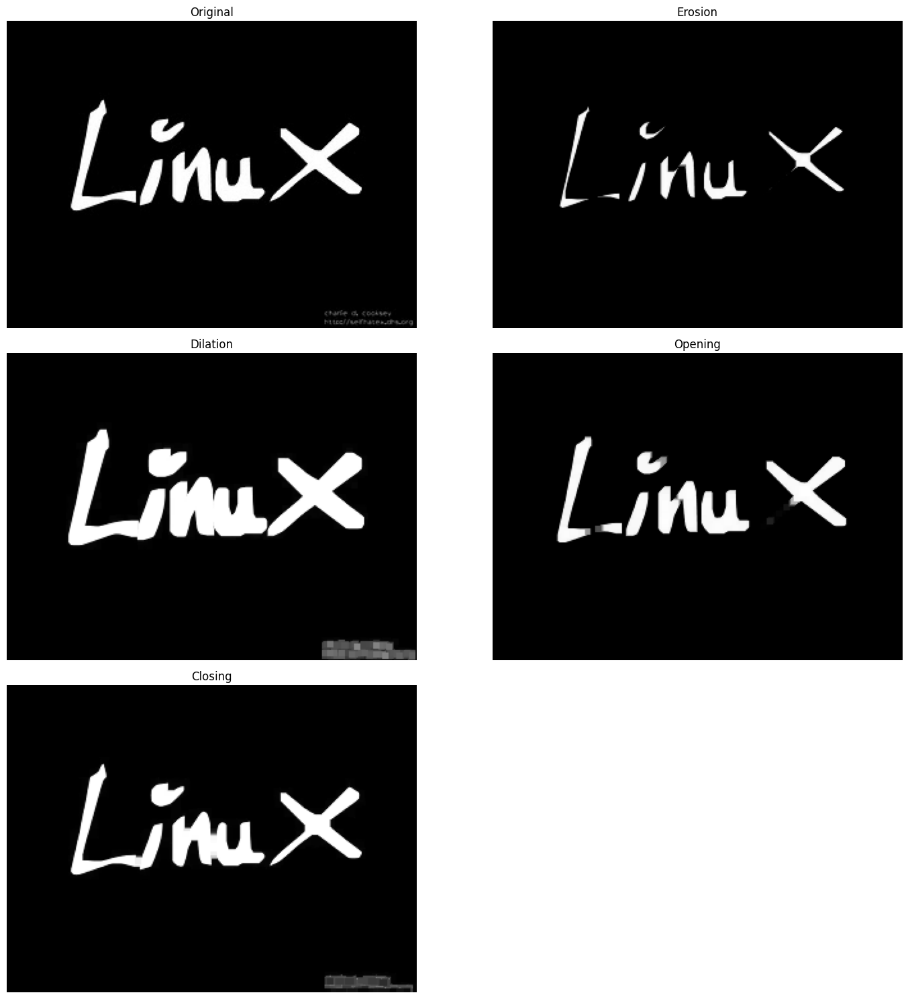

In [ ]:
# Morphological Transformations
# Učitavamo sliku i pretvaramo u RGB format (OpenCV koristi BGR po defaultu)
image = cv2.imread('images/data/LinuxLogo.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 15))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')


# 1️Definišemo kernel (element strukture)
# np.ones((5,5), np.uint8) pravi matricu 5x5 sa vrednostima 1
# Što je kernel veći, efekat erozije/dilatacije je izraženiji.
kernel = np.ones((5,5), np.uint8) # Probajte kernele različitih veličina


# Erosion (erozija)
# Uklanja piksele na ivicama objekata — objekat se smanjuje.
# Dobra za uklanjanje malih belih tačaka (šuma).
erosion = cv2.erode(image, kernel, iterations=1)
plt.subplot(3, 2, 2)
plt.title("Erosion")
plt.imshow(erosion); plt.axis('off')


# Dilation (dilatacija)
# Suprotna od erozije — dodaje piksele na ivicama, proširuje objekte.
# Koristi se kada želimo da naglasimo konture ili spojimo delove objekta.
dilation = cv2.dilate(image, kernel, iterations=1)
plt.subplot(3, 2, 3)
plt.title("Dilation")
plt.imshow(dilation); plt.axis('off')


# Opening (erozija pa dilatacija)
# Korisno za uklanjanje malih belih fleka (šuma) iz pozadine.
# Prvo „pojede“ male bele tačke (erozija), pa vrati oblik objekata (dilatacija).
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
plt.subplot(3, 2, 4)
plt.title("Opening")
plt.imshow(opening); plt.axis('off')


# Closing (dilatacija pa erozija)
# Suprotno od Opening: popunjava male crne rupe unutar objekta.
# Dobra za zaokruživanje ivica i popunjavanje praznina.
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
plt.subplot(3, 2, 5)
plt.title("Closing")
plt.imshow(closing); plt.axis('off')

plt.tight_layout(); plt.show()

**Zaključak**
- Erosion uklanja male detalje i tanke linije (čisti šum).
- Dilation ih vraća ili proširuje oblike.
- Kombinacijom njih dobijamo Opening i Closing, koje su izuzetno korisne u predobradi slika — naročito za OCR, segmentaciju objekata i prepoznavanje oblika.

# 4. Detekcija ivica — Sobel, Laplacian i Canny


Detekcija ivica (Edge Detection) je jedan od ključnih koraka u obradi slike i računalnom vidu.
Ideja je da pronađemo mesta u slici gde se intenzitet boje naglo menja – upravo ta mesta odgovaraju ivici objekta.

Postoji više pristupa za pronalaženje ivica:

- Sobel operator – koristi derivacije u X i Y pravcu da otkrije horizontalne i vertikalne ivice.

- Laplacian operator – koristi drugu derivaciju i pronalazi prelaze bez obzira na pravac.

- Canny algoritam – najpoznatiji i najpouzdaniji, koristi dvostruko pragovanje i histerezu za precizne ivice.

U sledećem primeru ćemo primeniti sva tri pristupa i vizuelno uporediti rezultate.

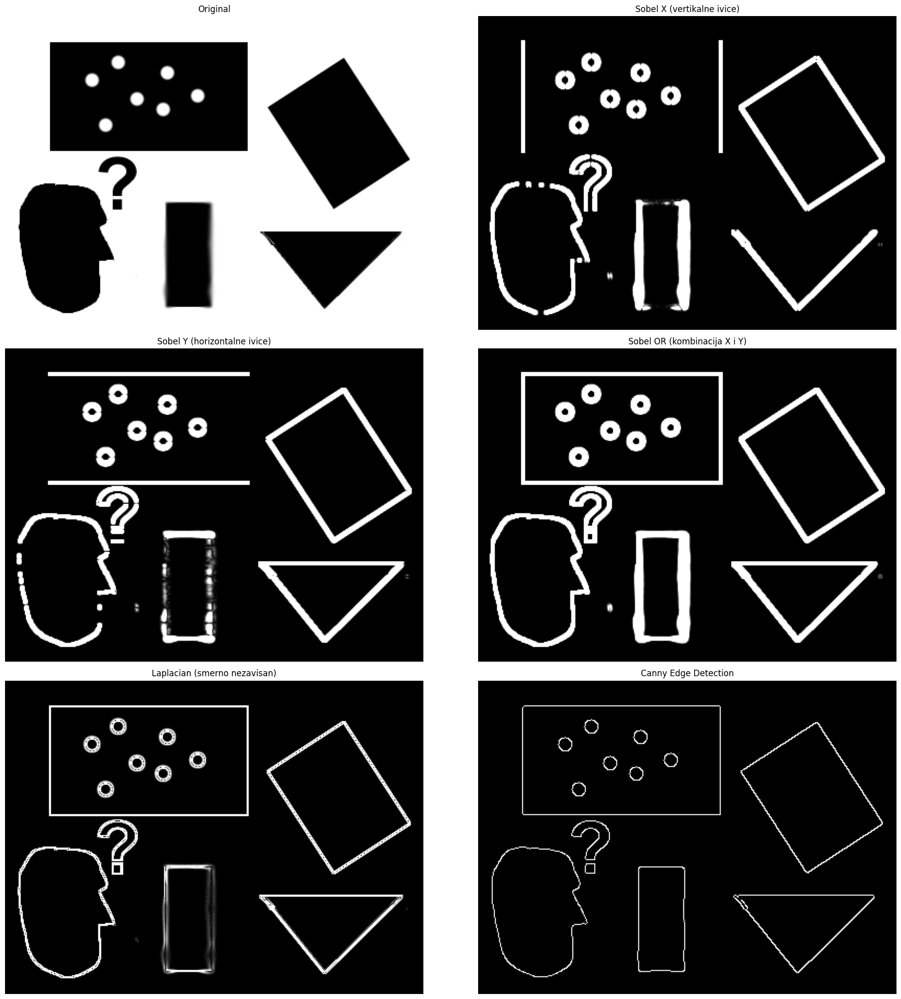

In [ ]:
# Učitavanje slike i priprema
# OpenCV učitava slike u BGR formatu, pa je konvertujemo u RGB zbog pravilnog prikaza u Matplotlib-u.
image = cv2.imread('images/data/pic1.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Za izračunavanje ivica radimo u grayscale režimu (jedan kanal je dovoljan)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

plt.figure(figsize=(20, 20))

# Prikaz originalne slike
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')


# SOBEL OPERATOR
# Sobel operator meri promenu intenziteta po horizontali (X) i vertikali (Y)
# cv2.Sobel(image, tip_podataka, dx, dy, veličina_kernela)
# dx=1, dy=0 → horizontalne ivice
# dx=0, dy=1 → vertikalne ivice

sobel_x64 = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)   # detekcija promena po X (vertikalne ivice)
sobel_y64 = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)   # detekcija promena po Y (horizontalne ivice)

# Rezultat pretvaramo u 8-bitni format radi prikaza
sobel_x = cv2.convertScaleAbs(sobel_x64)
sobel_y = cv2.convertScaleAbs(sobel_y64)

plt.subplot(3, 2, 2)
plt.title("Sobel X (vertikalne ivice)")
plt.imshow(sobel_x, cmap='gray'); plt.axis('off')

plt.subplot(3, 2, 3)
plt.title("Sobel Y (horizontalne ivice)")
plt.imshow(sobel_y, cmap='gray'); plt.axis('off')

# Kombinujemo oba pravca pomoću bitwise OR
sobel_OR = cv2.bitwise_or(sobel_x, sobel_y)

plt.subplot(3, 2, 4)
plt.title("Sobel OR (kombinacija X i Y)")
plt.imshow(sobel_OR, cmap='gray'); plt.axis('off')


# LAPLACIAN OPERATOR
# Laplacian koristi drugu derivaciju intenziteta i nalazi prelaze u svim pravcima.
# Dobro hvata tanke ivice i detalje.
lap64 = cv2.Laplacian(gray, cv2.CV_64F, ksize=3)
laplacian = cv2.convertScaleAbs(lap64)

plt.subplot(3, 2, 5)
plt.title("Laplacian (smerno nezavisan)")
plt.imshow(laplacian, cmap='gray'); plt.axis('off')


# CANNY DETEKCIJA IVICA
# Canny koristi gradijent i dva praga:
# - pikseli ispod donjeg praga (50) se odbacuju
# - pikseli iznad gornjeg praga (120) su definitivne ivice
# - pikseli između pragova postaju ivice ako su povezani s „jakim“ ivicama (histereza)
canny = cv2.Canny(gray, 50, 120)

plt.subplot(3, 2, 6)
plt.title("Canny Edge Detection")
plt.imshow(canny, cmap='gray'); plt.axis('off')

plt.tight_layout(); plt.show()

# 5. Ispravljanje perspektive (Perpsective Transform)

Kada fotografišemo dokument telefonom, papir je često pod uglom pa linije nisu paralelne.
Perspektivna transformacija (homografija) koristi 4 korespondentne tačke (uglove) da “rastegne” i poravna sliku u pravougaoni pogled odozgo.
Postupak:

- ručno (ili automatski) odaberemo 4 ugla na originalu,

- zadamo 4 ugla u “ravnom” izlazu (npr. dimenzije A4 odnosa),

- izračunamo matricu transformacije M i primenimo cv2.warpPerspective.

**Napomena**: Redosled tačaka mora biti konzistentan (tipično: gornje-levo, gornje-desno, donje-levo, donje-desno).

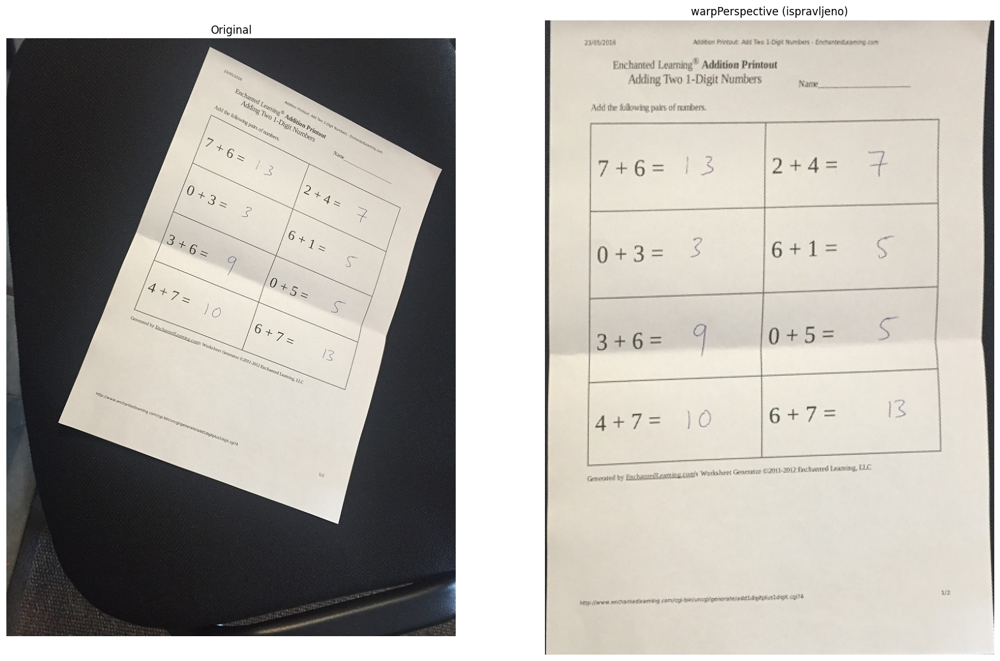

In [ ]:
# Učitavanje slike i konverzija u RGB (radi pravilnog prikaza u Matplotlib-u)
image = cv2.imread('images/data/scan.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.axis('off')

# Ručno zadati uglovi dokumenta na originalnoj slici (px)
#    REDOSLED: [gore-levo, gore-desno, dole-levo, dole-desno]
#    (Koordinate su primer — prilagodite ih vašoj slici!)
points_A = np.float32([
    [320,  15],   # gore-levo
    [700, 215],   # gore-desno
    [ 85, 610],   # dole-levo
    [530, 780]    # dole-desno
])

# Ciljni uglovi u "ispravljenom" pogledu (pravougaoni izlaz)
#    Ovde biramo platno dimenzija 420x594 (px) ~ odnos A4 (1 : 1.414)
points_B = np.float32([
    [  0,   0],   # gore-levo
    [420,   0],   # gore-desno
    [  0, 594],   # dole-levo
    [420, 594]    # dole-desno
])

# Računanje homografije (perspektivne transformacije)
M = cv2.getPerspectiveTransform(points_A, points_B)

# Primena transformacije: dobijamo "skener" efekat
warped = cv2.warpPerspective(image, M, (420, 594))

plt.subplot(1, 2, 2)
plt.title("Ispravljeno")
plt.imshow(warped)
plt.axis('off')
plt.show()


# 6. Promena veličine slike (Scaling & Interpolation)

Promena veličine slike je osnovna operacija u obradi slike.
Možemo umanjiti (downscale) ili uvećati (upscale) sliku, a da pri tom zadržimo što je moguće više vizuelnih detalja.
OpenCV funkcija cv2.resize() omogućava fleksibilno skaliranje pomoću različitih interpolacionih metoda, koje određuju kako se popunjavaju nove (ili nestale) vrednosti piksela.

Najčešće korišćene metode interpolacije su:

- INTER_LINEAR – podrazumevana metoda, dobra za uvećanja i smanjenja (brza, solidan kvalitet),

- INTER_CUBIC – koristi kubnu interpolaciju, daje glatke rezultate kod uvećanja, ali je sporija,

- INTER_AREA – koristi se pri smanjivanju slike (downscaling), zadržava detalje i smanjuje aliasing.

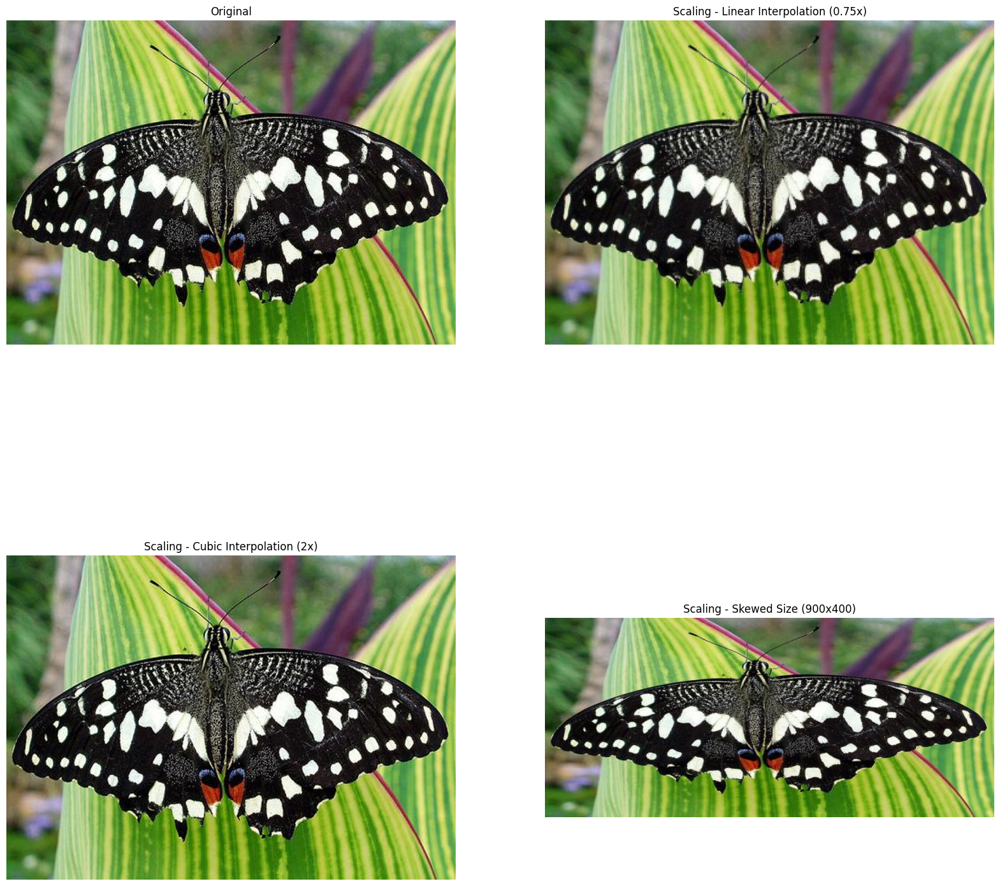

In [ ]:
# Učitavanje slike i konverzija u RGB (za ispravan prikaz u Matplotlib-u)
image = cv2.imread('images/data/butterfly.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Prikaz originalne slike
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')

# Umanjivanje slike na 3/4 originalne veličine
#     fx i fy određuju faktor skaliranja po x i y osi
#     INTER_LINEAR – dobra metoda za osnovna uvećanja/smanjenja
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation (0.75x)")
plt.imshow(image_scaled); plt.axis('off')

# Uvećavanje slike 2x pomoću kubne interpolacije
#     INTER_CUBIC – bolji kvalitet kod uvećanja (ali sporiji)
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation (2x)")
plt.imshow(img_scaled); plt.axis('off')

# Promena dimenzija slike na tačno 900x400 piksela (bez proporcionalnog odnosa)
#     INTER_AREA – pogodna metoda pri smanjenju slike
img_scaled = cv2.resize(image, (900, 400), interpolation=cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size (900x400)")
plt.imshow(img_scaled); plt.axis('off')

plt.show()

**Zadatak za istraživanje:**

Isprobajte i druge interpolacione metode:
INTER_NEAREST, INTER_LANCZOS4, INTER_LINEAR_EXACT i uporedite razlike u kvalitetu slike, posebno pri velikom uvećanju.
Takođe, primetite da promena odnosa stranica (npr. 900×400) dovodi do iskrivljenja (skew) slike.

# 7. Piramidalno skaliranje slike (Image Pyramids)

U obradi slike često želimo da analiziramo isti objekat na različitim nivoima detalja – na primer, prepoznati leptira i kada je slika smanjena ili uvećana.
Za to koristimo piramidalne reprezentacije slike, koje se sastoje od niza verzija slike sa različitim rezolucijama.

OpenCV omogućava jednostavno kreiranje ovih nivoa pomoću funkcija:

- cv2.pyrDown() – smanjuje sliku za faktor 2 (svaki piksel postaje rezultat obrade susednih piksela),

- cv2.pyrUp() – uvećava sliku za faktor 2 (interpolacijom između postojećih piksela).

Ove funkcije se često koriste u:

- detekciji objekata na različitim skalama,

- bržem prepoznavanju (analiza manjih verzija slike),

- filtriranju i kompresiji,

- multirezolucionim algoritmima poput Laplasove piramide.

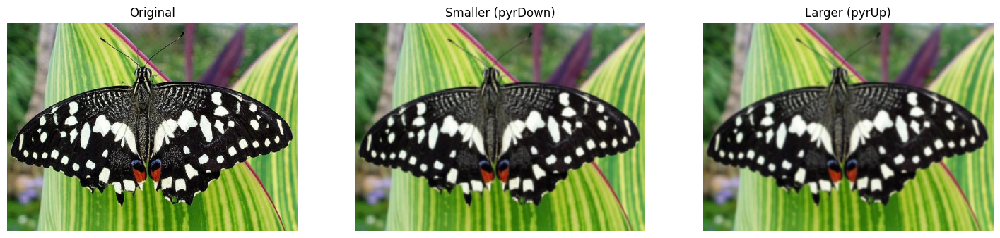

In [ ]:
# Učitavanje slike i konverzija u RGB format (radi ispravnog prikaza)
image = cv2.imread('images/data/butterfly.jpg')
if image is None:
    raise FileNotFoundError("Slika nije pronađena! Proveri putanju do 'images/data/butterfly.jpg'.")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(18, 6))

# Prikaz originalne slike
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')

# Smanjena verzija slike pomoću Gaussian pyramide
# pyrDown smanjuje rezoluciju slike 2x po dimenziji
smaller = cv2.pyrDown(image)

# Povećana verzija slike (rekonstrukcija)
# pyrUp uvećava prethodno smanjenu sliku nazad 2x po dimenziji
larger = cv2.pyrUp(smaller)

# Prikaz rezultata
plt.subplot(1, 3, 2)
plt.title("Smaller (pyrDown)")
plt.imshow(smaller); plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Larger (pyrUp)")
plt.imshow(larger); plt.axis('off')

plt.show()

# 8. Zamućivanje slike pomoću konvolucije (filter2D)


Konvolucija je osnovna operacija u obradi slike kojom se svaki piksel izračunava kao ponderisana suma susednih piksela.
Ta ponderisana matrica naziva se kernel ili filter, i određuje način na koji se slika obrađuje — npr. da li se zamućuje, izoštrava ili detektuju ivice.

Kada je kernel ispunjen jednakim vrednostima, rezultat je zamućivanje slike (blurring) jer se svaki piksel zamenjuje prosečnom vrednošću svojih suseda.
Veći kernel znači da se u obzir uzima šire područje slike → zamućenje postaje jače.

Ova tehnika se koristi u:

- uklanjanju šuma sa slike,

- omekšavanju prelaza između boja,

- pripremi slike za detekciju ivica ili segmente.

U sledećem primeru koristi se funkcija cv2.filter2D() koja direktno konvolvuje kernel sa slikom.

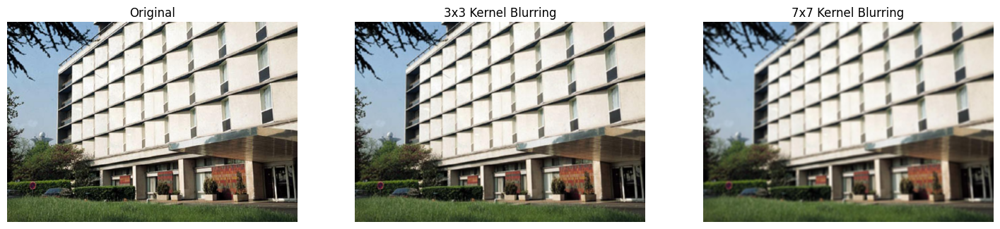

In [ ]:
# Učitavanje slike i konverzija u RGB radi pravilnog prikaza u Matplotlib-u
image = cv2.imread('images/data/building.jpg')
if image is None:
    raise FileNotFoundError("Slika nije pronađena! Proveri putanju do 'images/data/home.jpg'.")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(18, 6))

# Prikaz originalne slike
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')

# Kreiranje 3x3 kernela
# Svaki element ima vrednost 1/9 (jer 3x3=9), što znači da se piksel računa kao prosek 9 suseda
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# Primena filtera (konvolucije) pomoću funkcije filter2D
# -1 označava da se koristi isti broj kanala kao kod ulazne slike
blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(1, 3, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred); plt.axis('off')

# Kreiranje 7x7 kernela (jače zamućivanje jer se koristi više susednih piksela)
kernel_7x7 = np.ones((7, 7), np.float32) / 49
blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(1, 3, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2); plt.axis('off')

plt.show()

# 9. Pronalaženje kontura na slici


Konture su linije koje povezuju tačke slične boje ili intenziteta i predstavljaju obrise objekata na slici.
Detekcija kontura je jedan od najvažnijih koraka u analizi slike, jer omogućava:

- prepoznavanje i segmentaciju objekata,

- računanje površine, obima i oblika objekta,

- praćenje pokreta ili brojanje elemenata na slici.

U ovom primeru koristi se kombinacija:

- Canny detekcije ivica za pronalaženje granica objekata,

- cv2.findContours() za njihovo praćenje,

- cv2.drawContours() za prikazivanje pronađenih kontura.

Konture se obično pronalaze na binarnoj slici (npr. nakon Canny detekcije), a OpenCV ih vraća kao listu tačaka koje opisuju svaki pronađeni oblik.

Number of Contours found = 25


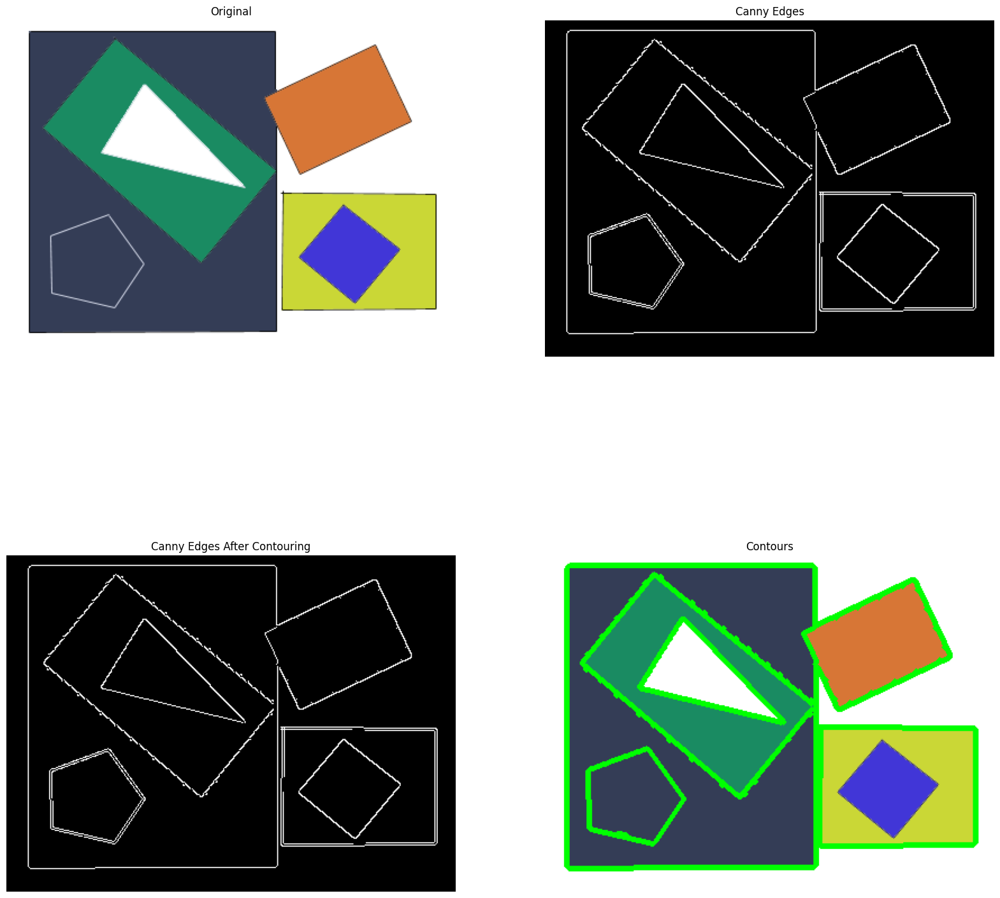

In [ ]:
# Učitavanje slike i konverzija u RGB za pravilno prikazivanje u Matplotlib-u
image = cv2.imread('images/data/pic5.png')
if image is None:
    raise FileNotFoundError("Slika nije pronađena! Proveri putanju do 'images/data/pic5.png'.")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Prikaz originalne slike
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')

# Konverzija slike u grayscale jer Canny radi na jednokanalnim slikama
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Detekcija ivica pomoću Canny algoritma
# Pragovi 30 i 200 definišu osetljivost detekcije
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny Edges")
plt.imshow(edged, cmap='gray'); plt.axis('off')

# Pronalaženje kontura na kopiji ivica (jer funkcija menja ulaznu sliku)
# cv2.RETR_EXTERNAL -> pronalazi samo spoljašnje konture
# cv2.CHAIN_APPROX_NONE -> čuva sve tačke konture (bez pojednostavljivanja)
contours, hierarchy = cv2.findContours(edged.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged, cmap='gray'); plt.axis('off')

print("Number of Contours found =", len(contours))

# Crtanje svih pronađenih kontura na slici
# -1 -> znači "nacrtaj sve konture"
# (0,255,0) -> zelena boja, 3px debljina
cv2.drawContours(image, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image); plt.axis('off')

plt.show()

**Zadatak za istraživanje:**

Eksperimentišite sa cv2.RETR_TREE umesto cv2.RETR_EXTERNAL da biste videli i unutrašnje konture (npr. rupe unutar objekata).

Probajte i cv2.CHAIN_APPROX_SIMPLE da biste smanjili broj tačaka konture (efikasnije za složene oblike).

Nakon pronalaženja kontura, možete izračunati njihovu površinu:

- area = cv2.contourArea(contours[0])

ili obim:

- perimeter = cv2.arcLength(contours[0], True)

# 10. Analiza oblika – pravougaonik, aproksimacija i konveksni omotač

cv2.approxPolyDP(contour, Approximation Accuracy, Closed)

* contour – is the individual contour we wish to approximate
* Approximation Accuracy – Important parameter is determining the accuracy of the approximation. Small values give precise- approximations, large values give more generic approximation. A good rule of thumb is less than 5% of the contour perimeter
* Closed – a Boolean value that states whether the approximate contour should be open or closed


Kada pronađemo konture objekata, sledeći korak je njihova analiza i pojednostavljenje.
OpenCV omogućava da iz svake konture izvučemo važne informacije o obliku — na primer, pravougaonik koji je obuhvata, jednostavniju konturu sa manje tačaka ili njen konveksni omotač.

- Bounding rectangle – najmanji pravougaonik koji potpuno obuhvata konturu.
Koristi se za prepoznavanje regiona interesa (ROI), detekciju objekata i praćenje kretanja.

- Contour approximation (cv2.approxPolyDP) – pojednostavljuje konturu tako da zadrži osnovni oblik, ali sa manje tačaka.
Idealno za identifikaciju geometrijskih oblika (trougao, pravougaonik, šestougao itd.).

- Convex hull – najmanja konveksna figura koja obuhvata konturu.
Zamislite da oko konture zategnete gumicu – to je upravo njen konveksni omotač.
Koristi se u analizi oblika ruke, tela, pokreta, pa i u detekciji nepravilnosti oblika.

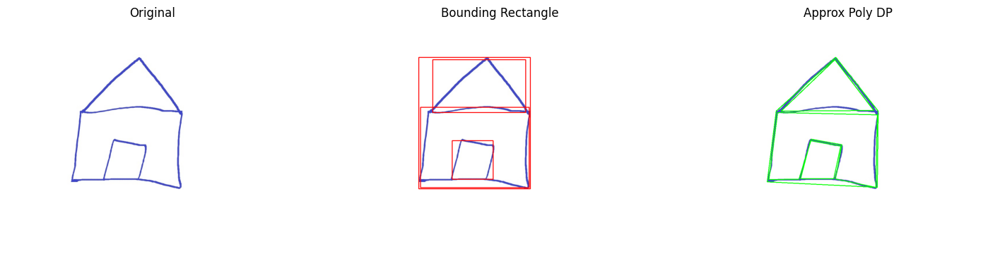

In [ ]:
# Učitavanje slike i konverzija u RGB format radi pravilnog prikaza
image = cv2.imread('images/data/house.jpg')
if image is None:
    raise FileNotFoundError("Slika 'house.jpg' nije pronađena!")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
orig_image = image.copy()

plt.figure(figsize=(18, 6))

#  Prikaz originalne slike
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(image); plt.axis('off')

# Konverzija u grayscale i binarizacija (inverzna – objekti postaju beli)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

# Pronalaženje kontura
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Crtanje bounding pravougaonika za svaku konturu
for c in contours:
    x, y, w, h = cv2.boundingRect(c)
    cv2.rectangle(orig_image, (x, y), (x+w, y+h), (255, 0, 0), 2)

plt.subplot(1, 3, 2)
plt.title("Bounding Rectangle")
plt.imshow(orig_image); plt.axis('off')

# Aproksimacija konture (pojednostavljivanje oblika)
for c in contours:
    # Tačnost aproksimacije kao procenat obima konture
    accuracy = 0.03 * cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, accuracy, True)
    cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)

plt.subplot(1, 3, 3)
plt.title("Approx Poly DP")
plt.imshow(image); plt.axis('off')

plt.show()

## Konveksni omotač

Konveksni omotač predstavlja najmanju konveksnu oblast koja sadrži sve tačke zadatog skupa (ili konture).

U kontekstu obrade slike, to znači da je konveksni omotač najmanja konveksna kriva koja u potpunosti obuhvata konturu objekta.

Za razliku od originalne konture, konveksni omotač eliminiše lokalne udubine i nepravilnosti, čime omogućava stabilniju analizu oblika.

Koristi se u zadacima gde je potrebno prepoznati grubu siluetu objekta, a ne njegove fine detalje — na primer, pri detekciji ruku, tela, lica ili granica objekata u sceni.

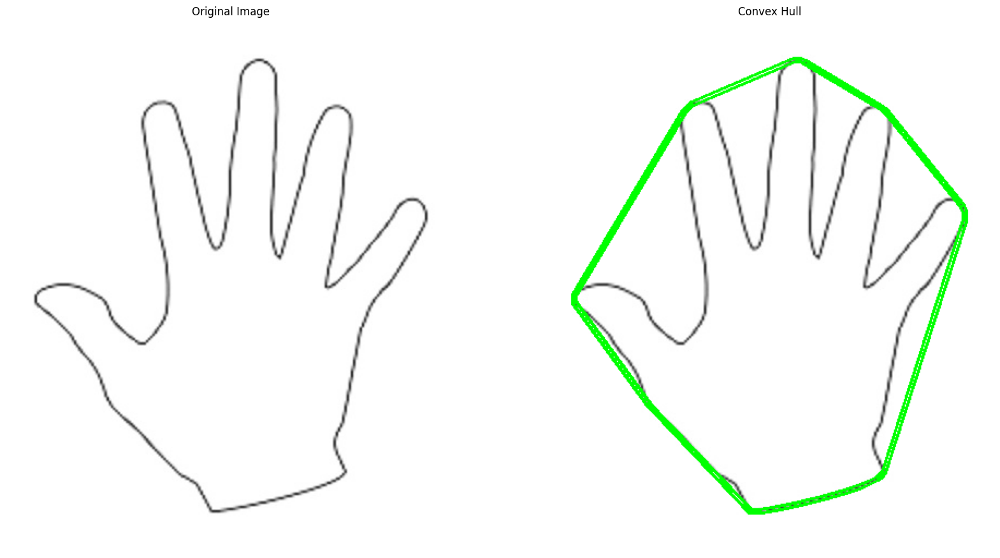

In [ ]:
# Učitavanje slike ruke i priprema
image = cv2.imread('images/data/hand.jpg')
if image is None:
    raise FileNotFoundError("Slika 'hand.jpg' nije pronađena!")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Binarizacija slike
ret, thresh = cv2.threshold(gray, 176, 255, 0)

# Pronalaženje kontura
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Uklanjamo najveću konturu (okvir slike)
contours = sorted(contours, key=cv2.contourArea, reverse=False)[:-1]

# Crtanje konveksnog omotača za svaku konturu
for c in contours:
    hull = cv2.convexHull(c)
    cv2.drawContours(image, [hull], 0, (0, 255, 0), 2)

plt.subplot(1, 2, 2)
plt.title("Convex Hull")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.show()


**Zadatak za istrazivanje:**

Pokušaj da promeniš sledeće parametre i posmatraj razlike u rezultatu:

**Aproksimacija kontura**
- U liniji accuracy = 0.03 * cv2.arcLength(c, True) probaj vrednosti 0.01, 0.05, 0.1.
- Manja vrednost = detaljnija kontura, veća = jednostavniji oblik.

**Pronalaženje kontura**
- Zameni cv2.RETR_LIST sa cv2.RETR_EXTERNAL ili cv2.RETR_TREE.
-  Primeti da RETR_EXTERNAL prikazuje samo spoljašnje oblike.

**Binarni prag**
- U liniji cv2.threshold(gray, 127, 255, ...) promeni vrednost 127 (npr. 100 ili 180).
-  Viši prag uklanja manje detalje, niži dodaje više kontura.

**Convex Hull poređenje**
- Nacrtaj konturu i njen omotač različitim bojama da vidiš gde hull „preskače“ udubljenja.

# 11. Prepoznavanje geometrijskih oblika pomoću kontura

Jedan od zanimljivih zadataka u obradi slike je automatsko prepoznavanje oblika — npr. da li je objekat na slici krug, kvadrat, trougao ili zvezda.

Ovaj problem se rešava pomoću kontura i funkcije cv2.approxPolyDP, koja pojednostavljuje svaku konturu do oblika sa manjim brojem temena.

Brojanjem tačaka aproksimirane konture (tj. temena) možemo zaključiti koji je geometrijski oblik u pitanju.

Logika:
- 3 temena → Trougao
- 4 temena → Kvadrat ili Pravougaonik
- 10 temena → Zvezda
- 15+ temena → Krug

(np.float64(-0.5), np.float64(999.5), np.float64(799.5), np.float64(-0.5))

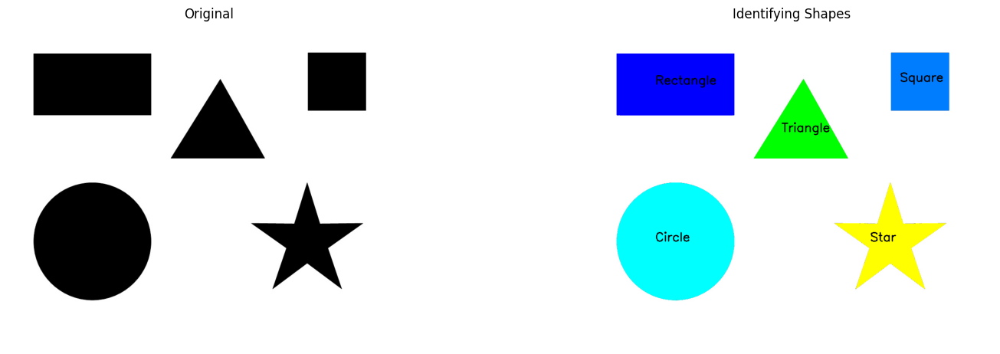

In [ ]:
# Učitavanje slike i konverzija u RGB (za ispravan prikaz u Matplotlib-u)
image = cv2.imread('images/data/someshapes.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Pretvaranje slike u grayscale (pojednostavljuje analizu i smanjuje broj kanala)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Priprema figure i prikaz originalne slike
plt.figure(figsize=(18, 12))
plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)
plt.axis('off')

# Binarizacija slike – svetli oblici postaju beli, pozadina crna
ret, thresh = cv2.threshold(gray, 127, 255, 1)

# Pronalaženje kontura
# cv2.RETR_LIST vraća sve konture bez hijerarhije
# cv2.CHAIN_APPROX_NONE čuva sve tačke konture
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Prolazak kroz svaku konturu i analiza oblika
for cnt in contours:

    # Aproksimacija konture (pojednostavljivanje oblika)
    # parametar 0.01 * cv2.arcLength -> određuje preciznost
    approx = cv2.approxPolyDP(cnt, 0.01 * cv2.arcLength(cnt, True), True)

    # TROUGAO (3 temena)
    if len(approx) == 3:
        shape_name = "Triangle"
        cv2.drawContours(image, [cnt], 0, (0, 255, 0), -1)

        # Izračunavanje centra konture pomoću momenata
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])

        # Ispis naziva oblika na slici
        cv2.putText(image, shape_name, (cx - 50, cy),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

    # KVADRAT ILI PRAVOUGAONIK (4 temena)
    elif len(approx) == 4:
        # Koordinate i dimenzije bounding box-a
        x, y, w, h = cv2.boundingRect(cnt)

        # Računanje centra
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])

        # Provera odnosa širine i visine (≈ kvadrat ako su skoro jednake)
        if abs(w - h) <= 3:
            shape_name = "Square"
            cv2.drawContours(image, [cnt], 0, (0, 125, 255), -1)
            cv2.putText(image, shape_name, (cx - 50, cy),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)
        else:
            shape_name = "Rectangle"
            cv2.drawContours(image, [cnt], 0, (0, 0, 255), -1)
            M = cv2.moments(cnt)
            cx = int(M['m10'] / M['m00'])
            cy = int(M['m01'] / M['m00'])
            cv2.putText(image, shape_name, (cx - 50, cy),
                        cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

    # ZVEZDA (10 temena)
    elif len(approx) == 10:
        shape_name = "Star"
        cv2.drawContours(image, [cnt], 0, (255, 255, 0), -1)

        # Centar i ispis naziva
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx - 50, cy),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

    # KRUG (više od 15 temena)
    elif len(approx) >= 15:
        shape_name = "Circle"
        cv2.drawContours(image, [cnt], 0, (0, 255, 255), -1)

        # Centar i ispis naziva
        M = cv2.moments(cnt)
        cx = int(M['m10'] / M['m00'])
        cy = int(M['m01'] / M['m00'])
        cv2.putText(image, shape_name, (cx - 50, cy),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 0), 2)

# Prikaz slike sa označenim oblicima
plt.subplot(2, 2, 2)
plt.title("Identifying Shapes")
plt.imshow(image); plt.axis('off')

# 12.Detekcija linija - Hough Lines

Na mnogim slikama možemo uočiti jasan uzorak pravih linija — poput ivica sudoku tabli, puteva, zidova ili kontura objekata.
Međutim, računaru nije lako da „vidi“ liniju kao celinu, jer je ona na slici zapravo samo niz odvojenih tačaka koje je otkrio detektor ivica (npr. Canny).

Hough transformacija omogućava da iz tih tačaka ponovo prepoznamo čitave linije.
Ideja je jednostavna, ali genijalna: svaka tačka ivice „predlaže“ sve linije koje bi kroz nju mogle proći, a linije koje dobiju najviše glasova prepoznaju se kao stvarne linije na slici.
Na taj način možemo detektovati i prikazati linije čak i kada su delimično prekinute ili prikrivene šumom.

Ova metoda je vrlo korisna u primenama kao što su:

- otkrivanje granica objekata,

- analiza perspektive u fotografiji,

- sprepoznavanje oblika i uzoraka (npr. sudoku mreža ili ivice saobraćajnica).

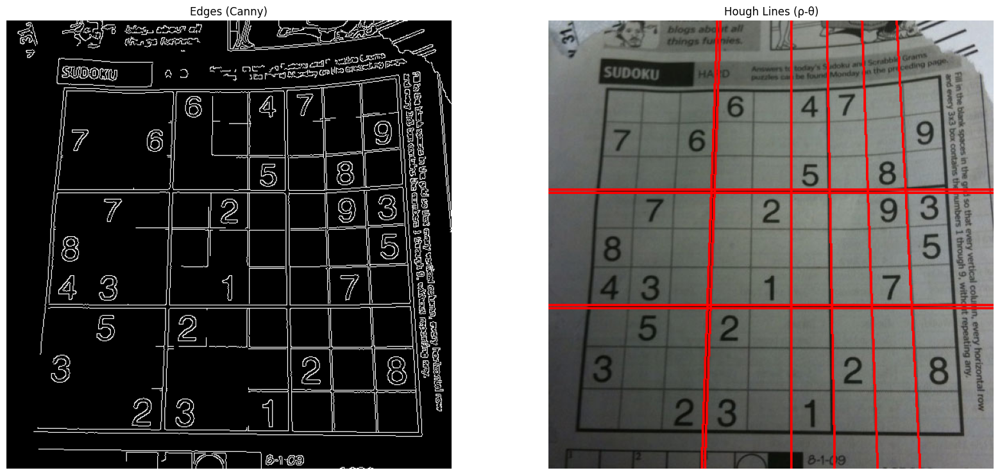

In [ ]:
# Učitavanje slike i konverzija u RGB (radi pravilnog prikaza u Matplotlib-u)
image = cv2.imread('images/data/sudoku.png')
if image is None:
    raise FileNotFoundError("Slika nije pronađena na 'images/data/sudoku.png'")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Grayscale + Canny ivice
# VAŽNO: pošto je slika već u RGB, koristimo COLOR_RGB2GRAY (ne BGR2GRAY)
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
edges = cv2.Canny(gray, 100, 170, apertureSize=3)

plt.subplot(2, 2, 1)
plt.title("Edges (Canny)")
plt.imshow(edges, cmap='gray')
plt.axis('off')

# Hough-ove linije (ρ rezolucija = 1px, θ = 1°)
# Prag 200 znači: linija mora imati ≥200 glasova (tačaka na liniji)
lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=200)

# Crtanje detektovanih linija na KOPIJI originala
vis = image.copy()

if lines is not None:
    for line in lines:
        rho, theta = line[0]
        # Parametarski oblik linije -> krajnje tačke za crtanje
        a, b = np.cos(theta), np.sin(theta)
        x0, y0 = a * rho, b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * ( a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * ( a))
        # Debljina 2 px; boja crvena (RGB)
        cv2.line(vis, (x1, y1), (x2, y2), (255, 0, 0), 2)
else:
    print("Upozorenje: Nije pronađena nijedna linija. Probaj smanjiti threshold ili prilagoditi Canny pragove.")

plt.subplot(2, 2, 2)
plt.title("Hough Lines (ρ-θ)")
plt.imshow(vis)
plt.axis('off')
plt.show()


# 13. Prebrojavanje krugova i elipsi

U računarstvu i obradi slike, blobovi (od eng. Binary Large Object) predstavljaju povezane regione piksela slične boje ili intenziteta.
Zamislite ih kao "mrlje" ili "mehuriće" na slici — to su delovi koji odudaraju od pozadine i mogu da predstavljaju objekte poput tačaka, kapljica, ćelija ili svetlih tačaka na tamnoj pozadini.

Metod SimpleBlobDetector iz biblioteke OpenCV automatski pronalazi takve oblasti na osnovu:

- površine (Area) – koliko je blob velik,

- kružnosti (Circularity) – koliko podseća na krug,

- konveksnosti (Convexity) – koliko je oblik “ispupčen”,

- inercije (Inertia) – meri koliko je blob izdužen ili okrugao.

Zahvaljujući ovim kriterijumima možemo filtrirati samo one oblike koji odgovaraju našim potrebama (npr. samo kružne oblike ili samo velike objekte).

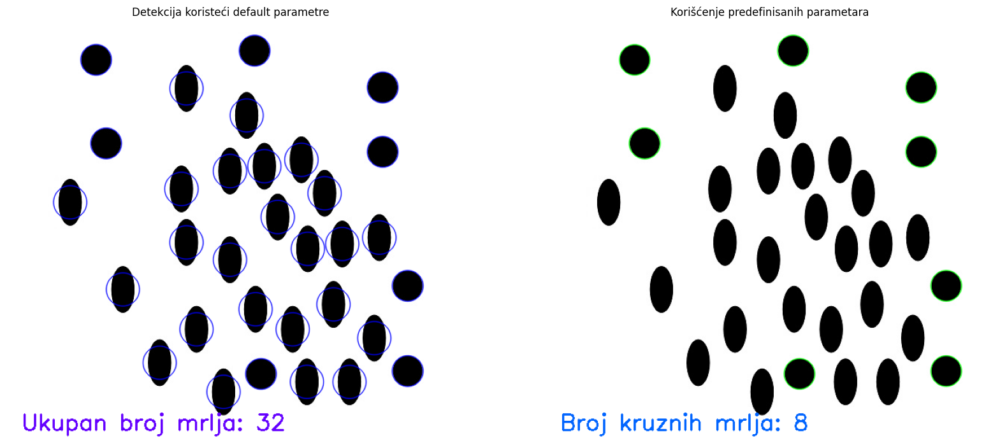

In [ ]:
# Učitavanje slike i konverzija u RGB
image = cv2.imread('images/data/blobs.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

# Kreiramo detektor sa podrazumevanim parametrima
detector = cv2.SimpleBlobDetector_create()

# Detektujemo blobove na slici
keypoints = detector.detect(image)

# Nacrtamo blobove kao plave krugove na kopiji slike
blank = np.zeros((1,1))
blobs = cv2.drawKeypoints(
    image, keypoints, blank, (0,0,255),
    cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

# Ispišemo ukupan broj pronađenih blobova
number_of_blobs = len(keypoints)
text = "Ukupan broj mrlja: " + str(number_of_blobs)
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (100, 0, 255), 2)

# Prikaz rezultata
plt.subplot(2, 2, 1)
plt.title("Detekcija koristeći default parametre")
plt.imshow(blobs); plt.axis('off')

# --------------------------------------------------------------

# Kreiramo novi set parametara za preciznije filtriranje
params = cv2.SimpleBlobDetector_Params()

# Filtriramo po površini — ignorišemo male blobove
params.filterByArea = True
params.minArea = 100

# Filtriramo po kružnosti — biramo oblike bliske krugu
params.filterByCircularity = True
params.minCircularity = 0.9

# Isključujemo filtriranje po konveksnosti (možemo i uključiti)
params.filterByConvexity = False
params.minConvexity = 0.2

# Filtriramo po inerciji — meri koliko je oblik izdužen
params.filterByInertia = True
params.minInertiaRatio = 0.01

# Kreiramo novi detektor sa definisanim parametrima
detector = cv2.SimpleBlobDetector_create(params)

# Detektujemo samo blobove koji ispunjavaju zadate uslove
keypoints = detector.detect(image)

# Crtamo ih zelenom bojom
blank = np.zeros((1,1))
blobs = cv2.drawKeypoints(
    image, keypoints, blank, (0,255,0),
    cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

# Ispisujemo koliko kružnih blobova je pronađeno
number_of_blobs = len(keypoints)
text = "Broj kruznih mrlja: " + str(number_of_blobs)
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

# Prikaz filtriranih blobova
plt.subplot(2, 2, 2)
plt.title("Korišćenje predefinisanih parametara")
plt.imshow(blobs); plt.axis('off')

plt.show()


**Zadatak za istraživanje:**

Istražite i druge parametre detektora — posebno minThreshold, maxThreshold i filterByColor.
Oni omogućavaju fino podešavanje detekcije, posebno kada radite sa slikama koje imaju različite nivoe osvetljenja ili kontrasta.

# 14.Detekcija temena pomoću Harris Corner Detector-a

U računarstvu i obradi slike, temena (corners) predstavljaju tačke na kojima se intenzitet slike menja u više pravaca odjednom — na primer, u ćoškovima šahovske table, zgrada, prozora ili drugih struktura sa oštrim prelazima.
Takve tačke su izuzetno korisne jer su stabilne i lako prepoznatljive, pa se koriste u brojnim oblastima kao što su:

- prepoznavanje objekata,

- praćenje pokreta,

- 3D rekonstrukcija scene,

- i spajanje (stitching) više slika u panoramu.

Jedan od prvih i najpoznatijih algoritama za ovu svrhu je Harris Corner Detector, koji analizira promene intenziteta piksela u lokalnom kvadratnom području slike.
Ideja je da se pronađu mesta gde i pomeranje u x i y pravcu dovodi do velike promene u vrednosti piksela — što ukazuje na prisustvo ugla.

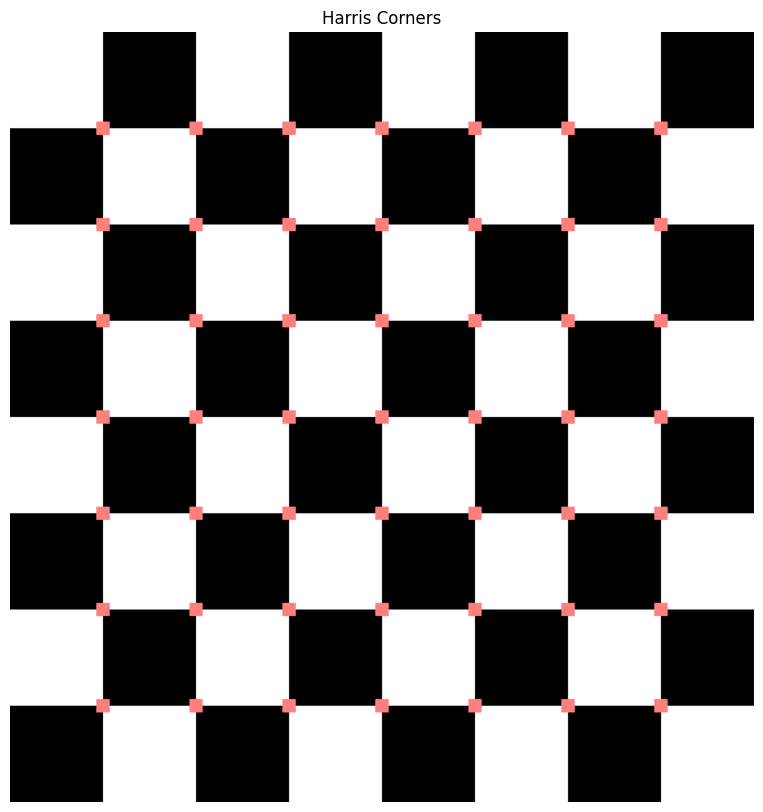

In [ ]:
# Učitavanje slike i konverzija u RGB format
image = cv2.imread('images/data/chessboard.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

# Konverzija slike u grayscale jer Harris radi sa intenzitetom svetla
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Harris Corner funkcija zahteva float32 tip podataka
gray = np.float32(gray)

# Primena Harris corner detektora
# cv2.cornerHarris(src, blockSize, ksize, k)
# blockSize – veličina susedstva (blok piksela)
# ksize – veličina Sobel kernela
# k – empirijski koeficijent (tipično između 0.04 i 0.06)
harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

# Diletacija (proširenje) tačaka temena radi bolje vidljivosti
kernel = np.ones((7,7), np.uint8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations=10)

# Prag za prikaz temena – može se prilagoditi prema slici
# Pikseli koji prelaze zadati prag označavaju se crvenkastom bojom
image[harris_corners > 0.025 * harris_corners.max()] = [255, 127, 127]

# Prikaz slike sa označenim temenima
plt.title("Harris Corners")
plt.imshow(image)
plt.axis('off'); plt.show()

Objašnjenje rezultata:

- Roze tačke označavaju temena na slici (uglove šahovske table).

- Povećanje iterations ili veličine kernela u cv2.dilate proširiće te tačke.

- Smanjenjem praga (0.025) možeš detektovati više (ali i potencijalno lažnih) temena.

**Zadatak za istraživanje:**

Pogledajte i alternativnu metodu za detekciju temena — Shi-Tomasi Corner Detector, koja se primenjuje pomoću funkcije cv2.goodFeaturesToTrack().
Ona često daje stabilnije i preciznije rezultate od klasičnog Harris detektora, naročito kod složenijih ili zamućenih slika.

# **15. Template Matching**

Template matching je tehnika u kojoj pokušavamo da pronađemo manju sliku (tzv. template) unutar veće slike (tzv. scene).
OpenCV funkcija cv2.matchTemplate() prolazi kroz svaku poziciju slike i meri koliko se region ispod templata poklapa sa samim template-om.
Rezultat je mapa sličnosti – što je vrednost veća, to je veća verovatnoća da se template nalazi na toj poziciji.
Na kraju pronalazimo maksimalnu vrednost (max_loc) i oko te oblasti crtamo okvir.

Ova metoda je korisna za:

detekciju poznatih objekata unutar slike (npr. logotipa, ikonica, lica, predmeta),

jednostavne vizuelne pretrage kada veličina i orijentacija objekta ostaju iste.

Ideja: imamo veliku sliku (scene) i manju sliku (template). Želimo da pronađemo koordinate na sceni gde se template najbolje poklapa.


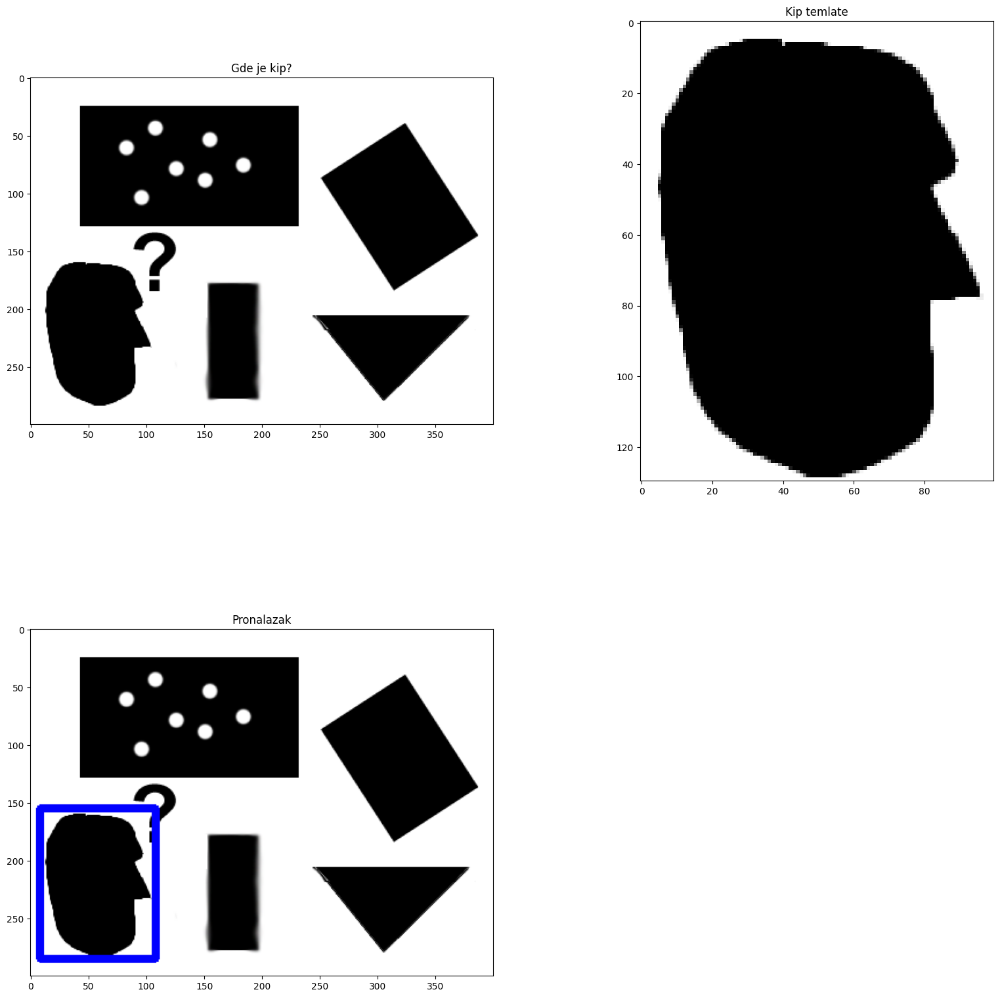

In [ ]:
# Učitavanje slike (scene) i konverzija iz BGR u RGB
# OpenCV po defaultu koristi BGR, dok Matplotlib očekuje RGB redosled boja.
image = cv2.imread('images/data/pic1.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Priprema prikaza
plt.figure(figsize=(20, 20))

# Prikaz originalne slike
plt.subplot(2, 2, 1)
plt.title("Gde je kip?")
plt.imshow(image)

#Konverzija scene u grayscale (lakše poređenje jer matchTemplate radi na jednoj komponenti)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Učitavanje male slike (template) koju želimo da pronađemo
# Template mora biti grayscale (drugi argument 0 u imread)
template = cv2.imread('images/data/templ.png',0)

# Prikaz template slike
plt.subplot(2, 2, 2)
plt.title("Kip temlate")
plt.imshow(template, cmap='gray')

# Primena Template Matching algoritma
# Funkcija vraća "mapu sličnosti" – svaka vrednost pokazuje koliko se region poklapa sa template-om
result = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF)
# Izračunavanje pozicije maksimalnog poklapanja
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

# Kreiranje okvira oko pronađenog regiona
# Koordinate okvira definišemo pomoću gornjeg levog ugla (top_left) i donjeg desnog (bottom_right)
top_left = max_loc
bottom_right = (top_left[0] + 100, top_left[1] + 130)
cv2.rectangle(image, top_left, bottom_right, (0,0,255), 5)

# Prikaz slike sa ucrtanim okvirom
plt.subplot(2, 2, 3)
plt.title("Pronalazak")
plt.imshow(image)

# **16. Detekcija lica pomoću Viola Jones/Haar-like i Adaboost Cascade**
Haar-like funkcije su vrlo korisne karakteristike fotografije koje se koriste u detekciji objekata.

Viola i Jones su ih uveli u prvi detektor lica u stvarnom vremenu. Korišćenjem integralnih fotografija, Haar-ove karakteristike bilo koje veličine (skale) mogu se efikasno izračunati u konstantnom vremenu.

Brzina računanja je ključna prednost Haar-ove funkcije u odnosu na većinu drugih karakteristika. Korišćenjem Viola-Jones algoritma za otkrivanje lica, lica se mogu otkriti na fotografiji pomoću ovih Haar-sličnih karakteristika. Svaka Haar-ova karakteristika deluje samo kao slabi klasifikator, pa je stoga potreban ogroman broj ovih karakteristika da bi se detektovalo lice sa dobrom tačnošću. Zbog toga se izračunava veliki broj karakteristika za sve moguće lokacije i veličine svakog Haar-sličnog jezgra, koristeći integralne fotografije. Zatim se klasifikator ansambla AdaBoost koristi za odabir važnih karakteristika iz ogromnog broja svojstava i njihovo kombinovanje u jak model klasifikatora tokom faze treninga. Naučeni model se zatim koristi za klasifikaciju regiona lica sa izabranim karakteristikama i može se koristiti kao detektor lica.

Koristićemo unapred obučene klasifikatore OpenCV (odnosno detektore) za lice i oči kako bismo otkrili ljudska lica na fotografiji. Ovi prethodno obučeni klasifikatori su serializovani kao KSML datoteke i isporučuju se sa OpenCVinstalacijom.

Lica na fotografiji mogu se pronaći pomoću funkcije cv2.detectMultiScale() sa prethodno obučenim kaskadnim klasifikatorom lica.

Ova funkcija prihvata sledeće parametre:

- **scaleFactor**: Ovo je parametar koji određuje u kojoj meri se veličina fotografije smanjuje za svaku skalu fotografije i koristi za stvaranje piramide skale (npr. faktor skale od 1,2 znači smanjenje veličine za 20%). Što je manji parametar scaleFactor, to je veća šansa da se pronađe odgovarajuća veličina (za otkrivanje, sa modelom).

- **minNeighbors**: Ovo je parametar koji određuje broj komšija koje svaki pravougaonik kandidat treba da zadrži. Ovaj parametar utiče na kvalitet otkrivenih lica - veća vrednost omogućava otkrivanje sa boljim kvalitetom, ali manjim brojem.

- **minSize** i maxSize: Ovo su minimalne i maksimalne moguće veličine objekata. Objekti koji prelaze vrednosti biće zanemareni.

Kada se detektuju lica, funkcija lica vraća položaje lica kao Rect(x, y, w, h).

Jednom kada se dobije okvir za ograničavanje lica, on definiše ROI za lice, a zatim se može primeniti detekcija oka/osmeha na ovom ROI (pošto su oči/osmeh uvek na licu).

22


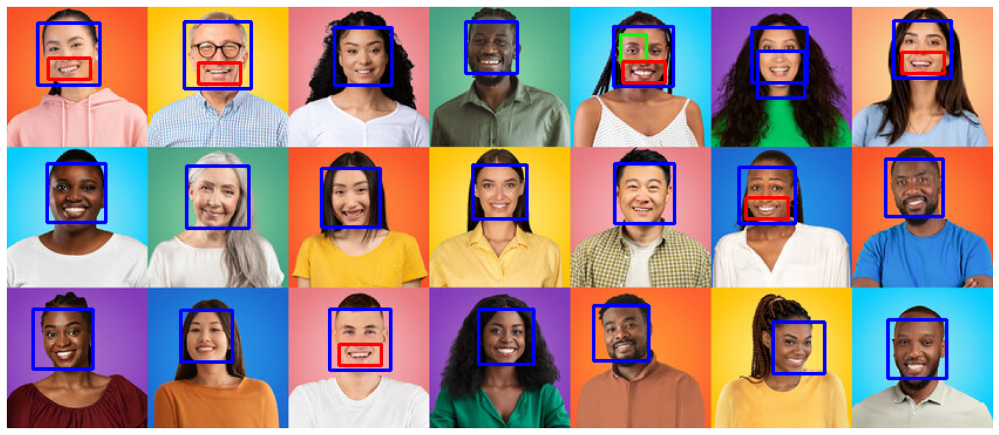

In [ ]:
# Učitajte prethodno obučene klasifikatore da biste otkrili lice, oči i osmeh
# Učitaj ugrađene modele direktno iz OpenCV distribucije
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_alt2.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
smile_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_smile.xml')


# Pročitajte ulaznu fotografiju i pretvorite je u sive tonove
# Otkrijte lica prisutna na fotografiji pomoću modela kaskadnog klasifikatora lica
img = cv2.imread('images/data/faces.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.01, 8) # scaleFactor=1.2, minNbr=5
print(len(faces)) # broj detektovanih lica = 7

# Unutar svake kutije za ograničavanje lica otkrijte oči i osmeh pomoću odgovarajućih prethodno obučenih modela
# Nacrtajte granična polja koja odgovaraju otkrivenim licima, očima i osmesima
for (x,y,w,h) in faces:
    img = cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray, 1.04, 10)
    #print(eyes) # lokacija očiju
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)
    smile = smile_cascade.detectMultiScale(roi_gray, 1.38, 6)
    for (mx,my,mw,mh) in smile:
        cv2.rectangle(roi_color,(mx,my),(mx+mw,my+mh),(0,0,255),2)

plt.figure(figsize=(15,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.axis('off')
plt.tight_layout()
plt.show()

# Dodatni primer — Funny Mirrors Using OpenCV
Source: https://www.learnopencv.com/funny-mirrors-using-opencv/

Funny mirrors are not plane mirrors but a combination of convex/concave reflective surfaces that produce distortion effects that look funny as we move in front of these mirrors.

### How does it work ?
The entire project can be divided into three major steps :

* Create a virtual camera.
* Define a 3D surface (the mirror surface) and project it into the virtual camera using a suitable value of projection matrix.
* Use the image coordinates of the projected points of the 3D surface to apply mesh based warping to get the desired effect of a funny mirror.

![](https://www.learnopencv.com/wp-content/uploads/2020/04/steps-for-funny-mirrors.jpg)



In [ ]:
!pip install vcam

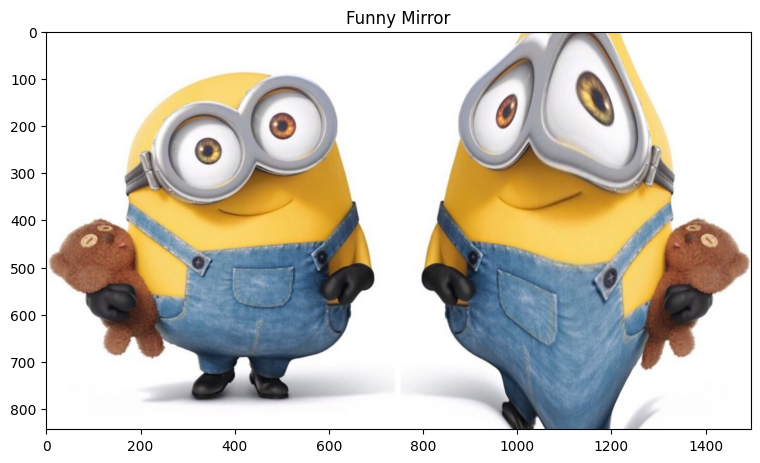

In [ ]:
import cv2
import numpy as np
import math
from vcam import vcam,meshGen
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("images/data/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*exp^((x/w)^2 / 2*0.1*sqrt(2*pi))

plane.Z += 20*np.exp(-0.5*((plane.X*1.0/plane.W)/0.1)**2)/(0.1*np.sqrt(2*np.pi))
pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))

So now as we know that by defining Z as a function of X and Y we can create different types of distortion effects. Let us create some more effects using the above code. We simply need to change the line where we define Z as a function of X and Y. This will further help you to create your own effects.

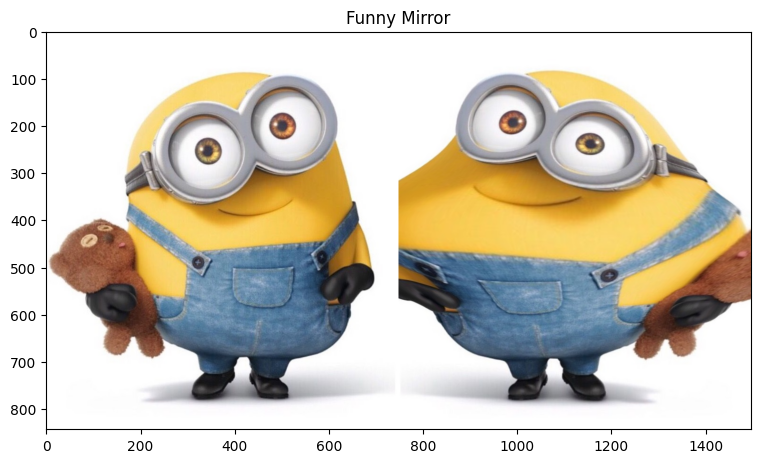

In [ ]:
plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("images/data/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*exp^((y/h)^2 / 2*0.1*sqrt(2*pi))
plane.Z += 20*np.exp(-0.5*((plane.Y*1.0/plane.H)/0.1)**2)/(0.1*np.sqrt(2*np.pi))

pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))

Let’s create something using sine function !

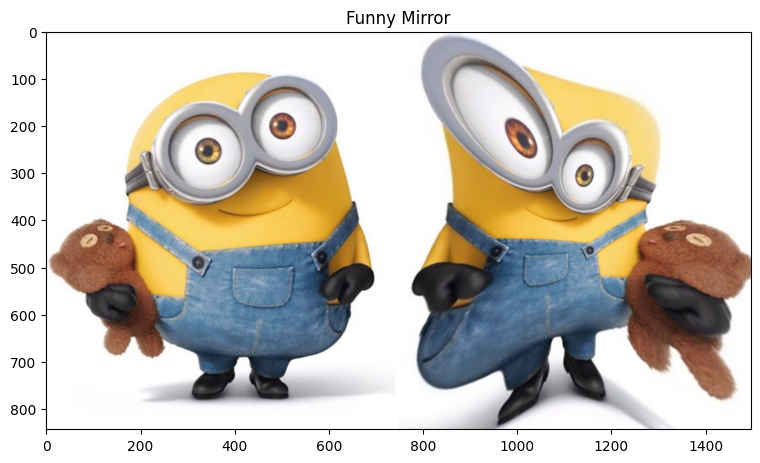

In [ ]:
plt.figure(figsize=(20, 20))

# Reading the input image. Pass the path of image you would like to use as input image.
img = cv2.imread("images/data/minions.jpg")
H,W = img.shape[:2]

# Creating the virtual camera object
c1 = vcam(H=H,W=W)

# Creating the surface object
plane = meshGen(H,W)

# We generate a mirror where for each 3D point, its Z coordinate is defined as Z = 20*[ sin(2*pi*(x/w-1/4))) + sin(2*pi*(y/h-1/4))) ]

plane.Z += 20*np.sin(2*np.pi*((plane.X-plane.W/4.0)/plane.W)) + 20*np.sin(2*np.pi*((plane.Y-plane.H/4.0)/plane.H))

pts3d = plane.getPlane()

pts2d = c1.project(pts3d)
map_x,map_y = c1.getMaps(pts2d)

output = cv2.remap(img,map_x,map_y,interpolation=cv2.INTER_LINEAR)

plt.subplot(1, 2,1)
plt.title("Funny Mirror")
plt.imshow(cv2.cvtColor(np.hstack((img,output)), cv2.COLOR_BGR2RGB))